In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from data_import import import_ppd
import plotly.graph_objects as go


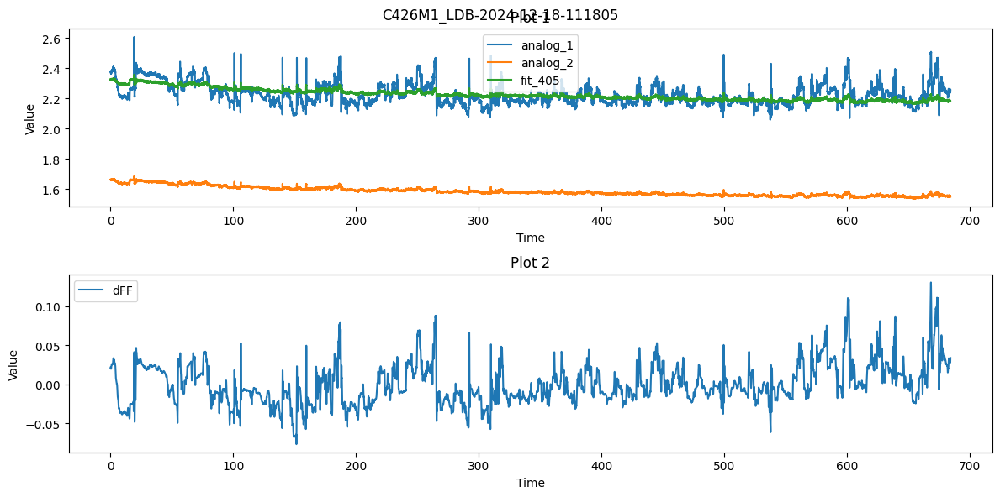

In [2]:
# Define the PPD file path
#ppd_file_path = r'H:\fp_test\innate_fear\astro\1198-2024-06-11-125528.ppd'
#ppd_file_path = r'H:\fp_test\1195_test-2024-06-05-113638.ppd'
#ppd_file_path = r'H:\fp_test\1196_test-2024-06-05-114030.ppd'
#ppd_file_path = r'H:\fp_test\innate_fear\grabda\521-2023-07-17-123201.ppd'
#ppd_file_path = r'H:\fp_test\innate_fear\astro\1194-2024-06-10-141639.ppd'
ppd_file_path = r'H:\Jun\sensory_stim\617_SNI-2024-06-06-125303.ppd'
ppd_file_path = r'H:\Jun\sensory_stim\618_sham-2024-06-07-153641.ppd'
ppd_file_path = r'H:\Jun\sensory_stim\fp\618-2023-11-16-173028.ppd'

ppd_file_path = r'H:\Jun\sensory_stim\grabda\fp\1498_ctrl-2024-11-07-144614.ppd'
ppd_file_path = r'H:\Jun\sensory_stim\grabda\fp\1498_sni-2024-11-27-114736.ppd'
ppd_file_path = r'H:\Magdalena\photometry\fp_recordings\LDB\C426M1_LDB-2024-12-18-111805.ppd'

#ppd_file_path = r'H:\Magdalena\behavioral experiments\sensory stimulation\ACh_sensory\round_2\C426M1-2024-12-04-133620.ppd'

# Extract the filename without the extension
filename = os.path.splitext(os.path.basename(ppd_file_path))[0]

# Load the data from the CSV file
data = import_ppd(ppd_file_path, low_pass=20, high_pass=0.001)

# Convert sample index to time vector
time = np.arange(len(data['analog_1'])) / data['sampling_rate']

# http://dx.doi.org/10.1016/j.cell.2015.07.014
# dFF using 405 fit as baseline
reg= np.polyfit(data['analog_2'], data['analog_1'], 1) # ch1 is 465nm, ch2 is 405nm 
fit_405=reg[0]*data['analog_2']+reg[1]
dFF=(data['analog_1']-fit_405)/fit_405 #this gives deltaF/F
data['fit_405']=fit_405
data['dFF']=dFF

# Apply Savitzky-Golay filter to smooth dFF
smoothed_dFF = savgol_filter(dFF, window_length=100, polyorder=5)

# Create the figure and subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))

# Plot 1
ax1.plot(time, data['analog_1'], label='analog_1')
ax1.plot(time, data['analog_2'], label='analog_2')
ax1.plot(time, data['fit_405'], label='fit_405')

# Set plot 1 properties
ax1.set_xlabel('Time')
ax1.set_ylabel('Value')
ax1.set_title('Plot 1')
ax1.legend()

# Plot 2
ax2.plot(time, smoothed_dFF, label='dFF')

# Set plot 2 properties
ax2.set_xlabel('Time')
ax2.set_ylabel('Value')
ax2.set_title('Plot 2')
ax2.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Set the figure title
fig.suptitle(filename)

# Save the figure as PNG with 300 dpi
save_path = os.path.join(os.path.dirname(ppd_file_path), filename + '.png')
fig.savefig(save_path, dpi=300)

# Display the plots
plt.show()

# Create the plot
fig = go.Figure()

# Add a trace
fig.add_trace(go.Scatter(x=time, y=smoothed_dFF, mode='lines', name='dFF'))

# Customize the layout
fig.update_layout(
    title='Interactive dFF Plot',
    xaxis_title='Time (s)',
    yaxis_title='dFF',
    template='plotly_dark'
)

#save_path_plotly = os.path.join(os.path.dirname(ppd_file_path), filename + '_plotly.png')
#fig.write_image(save_path_plotly, format='png', scale=5)

# Show the plot
fig.show()


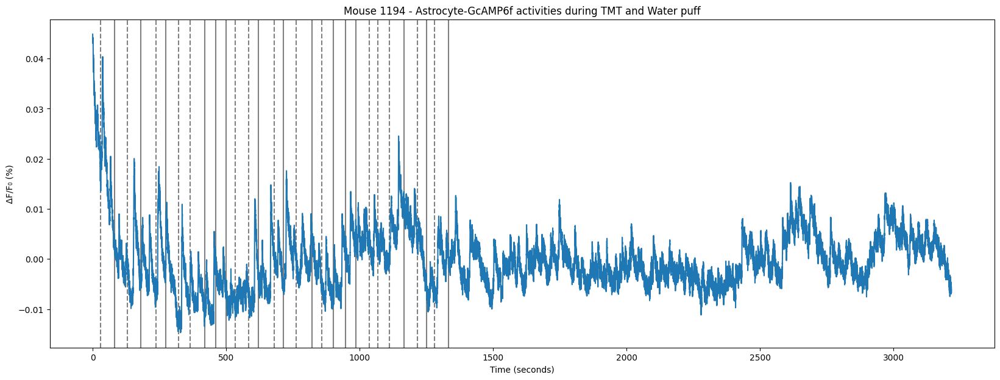

In [34]:
import numpy as np
import matplotlib.pyplot as plt


time_stamps = ['00:29', '01:23', '02:10', '03:00', '03:56', '04:34', '05:22', '06:06', '07:00', '07:41',
                     '08:20', '08:53', '09:44', '10:20', '11:20', '11:55', '12:41', '13:41', '14:19', '15:01',
                     '15:48', '16:26', '17:15', '17:48', '18:31', '19:27', '20:16', '20:50', '21:20', '22:13']
stim_data = [0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1]  # 0 for water, 1 for TMT
sampling_rate = 130  # Replace with your actual sampling rate

# Convert timestamps to seconds
def time_stamp_to_seconds(time_stamp):
    minutes, seconds = map(int, time_stamp.split(':'))
    return minutes * 60 + seconds

# Convert timestamps to sample indices
time_in_seconds = [time_stamp_to_seconds(ts) for ts in time_stamps]
data_indexes = [int(ts * sampling_rate) for ts in time_in_seconds]

# Create a time array for plotting (adjust the range as needed)
time = np.arange(0, len(smoothed_dFF)) / sampling_rate

# Set figure size to make the plot wider
plt.figure(figsize=(20, 7))

# Mark the timestamps in the trace array
for i, stim in enumerate(stim_data):
    if stim == 0:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='dashed', ymax=1)
    else:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='solid', ymax=1)

plt.plot(time, smoothed_dFF, label='dFF')

plt.xlabel('Time (seconds)')
plt.ylabel('ΔF/F₀ (%)')
plt.title('Mouse 1194 - Astrocyte-GcAMP6f activities during TMT and Water puff')
plt.show()


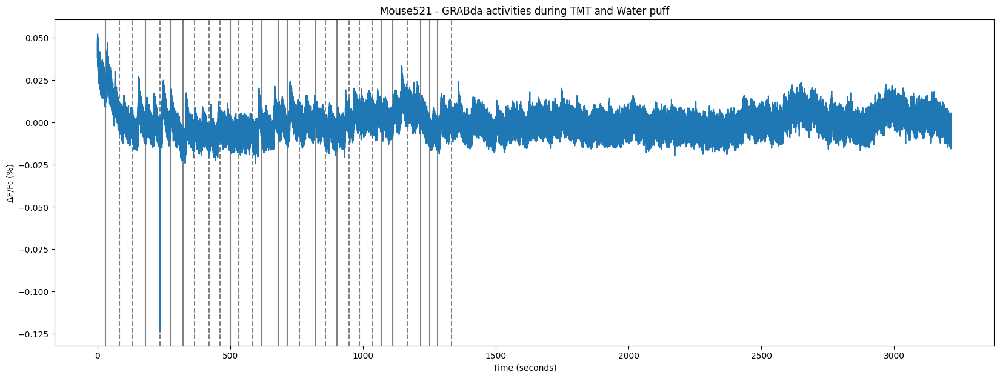

In [35]:
import numpy as np
import matplotlib.pyplot as plt



time_stamps = ['00:29', '01:23', '02:10', '03:00', '03:56', '04:34', '05:22', '06:06', '07:00', '07:41',
                     '08:20', '08:53', '09:44', '10:20', '11:20', '11:55', '12:41', '13:41', '14:19', '15:01',
                     '15:48', '16:26', '17:15', '17:48', '18:31', '19:27', '20:16', '20:50', '21:20', '22:13']
stim_data = [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0]  # 0 for water, 1 for TMT
sampling_rate = 130  # Replace with your actual sampling rate

# Convert timestamps to seconds
def time_stamp_to_seconds(time_stamp):
    minutes, seconds = map(int, time_stamp.split(':'))
    return minutes * 60 + seconds

# Convert timestamps to sample indices
time_in_seconds = [time_stamp_to_seconds(ts) for ts in time_stamps]
data_indexes = [int(ts * sampling_rate) for ts in time_in_seconds]

# Create a time array for plotting (adjust the range as needed)
time = np.arange(0, len(smoothed_dFF)) / sampling_rate

# Set figure size to make the plot wider
plt.figure(figsize=(20, 7))

# Mark the timestamps in the trace array
for i, stim in enumerate(stim_data):
    if stim == 0:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='dashed', ymax=1)
    else:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='solid', ymax=1)

plt.plot(time, dFF, label='dFF')

plt.xlabel('Time (seconds)')
plt.ylabel('ΔF/F₀ (%)')
plt.title('Mouse521 - GRABda activities during TMT and Water puff')
plt.show()


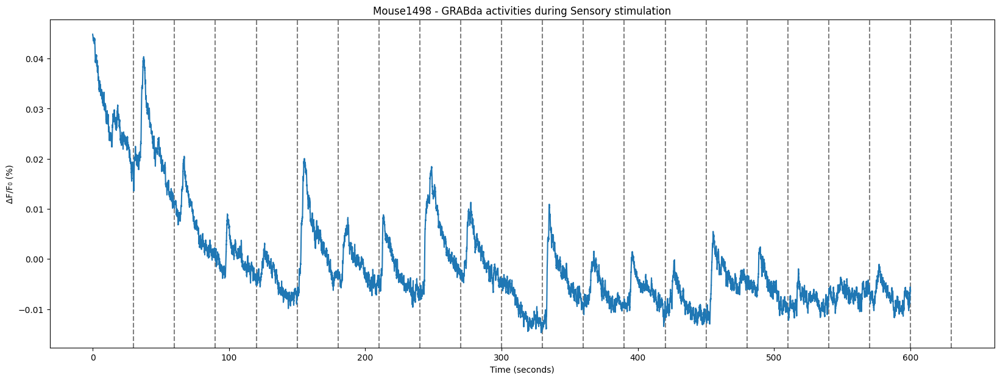

In [36]:
import numpy as np
import matplotlib.pyplot as plt



time_stamps = ['00:30', '01:00', '01:30', '02:00', '02:30', '03:00', '03:30', '04:00', '04:30', '05:00',
                     '05:30', '06:00', '06:30', '07:00', '07:30', '08:00', '08:30', '09:00', '09:30', '10:00',
                     '10:30']
stim_data = [1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0]  # 0 for water, 1 for TMT
sampling_rate = 130  # Replace with your actual sampling rate

# Convert timestamps to seconds
def time_stamp_to_seconds(time_stamp):
    minutes, seconds = map(int, time_stamp.split(':'))
    return minutes * 60 + seconds

# Convert timestamps to sample indices
time_in_seconds = [time_stamp_to_seconds(ts) for ts in time_stamps]
data_indexes = [int(ts * sampling_rate) for ts in time_in_seconds]

# Create a time array for plotting (adjust the range as needed)
time = np.arange(0, len(smoothed_dFF[:600*130])) / sampling_rate

# Set figure size to make the plot wider
plt.figure(figsize=(20, 7))

# Mark the timestamps in the trace array
for i, stim in enumerate(stim_data):
    if stim == 0:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='dashed', ymax=1)
    else:
        plt.axvline(x=time_in_seconds[i], color='gray', linestyle='dashed', ymax=1)

plt.plot(time, smoothed_dFF[:600*130], label='dFF')

plt.xlabel('Time (seconds)')
plt.ylabel('ΔF/F₀ (%)')
plt.title('Mouse1498 - GRABda activities during Sensory stimulation')
plt.show()


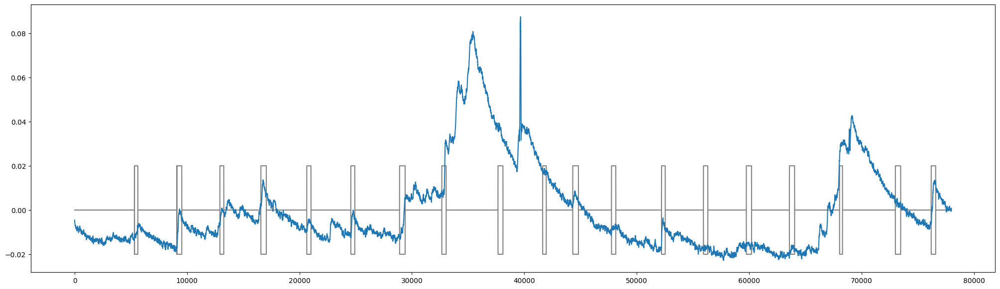

In [ ]:
from turtle import color

# Set figure size to make the plot wider
plt.figure(figsize=(25, 7))

plt.plot(data['digital_1'][:600*130]/50, color='gray')
plt.plot(-data['digital_1'][:600*130]/50, color='gray')

plt.plot(smoothed_dFF[:600*130])


In [38]:
# Create a dataframe to store the smoothed_dFF, time stamps, and stim data
data_length = len(smoothed_dFF)
stim_markers = np.full(data_length, -1)

for i, index in enumerate(data_indexes):
    stim_markers[index] = stim_data[i]

# Create a DataFrame
df = pd.DataFrame({
    'Time (seconds)': time,
    'dFF': dFF,
    'smoothed_dFF': smoothed_dFF,
    'Stim': stim_markers
})

# Save the DataFrame to an Excel file
df.to_excel('Mouse_521_dFF_with_stim.xlsx', index=False)

ValueError: All arrays must be of the same length

## Batch processing

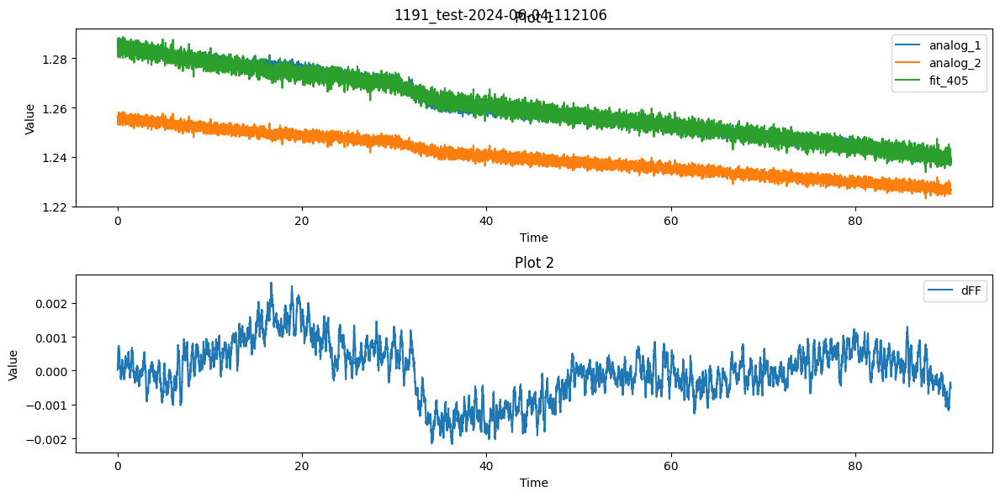

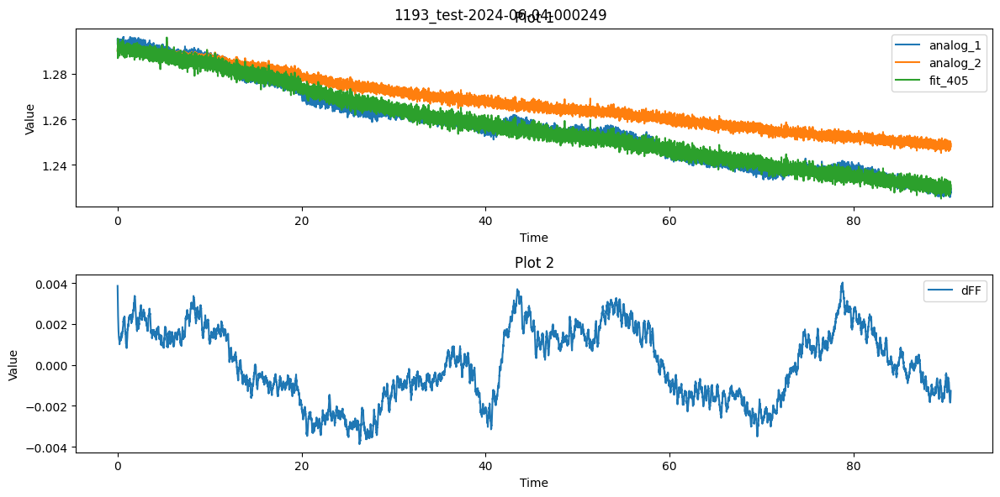

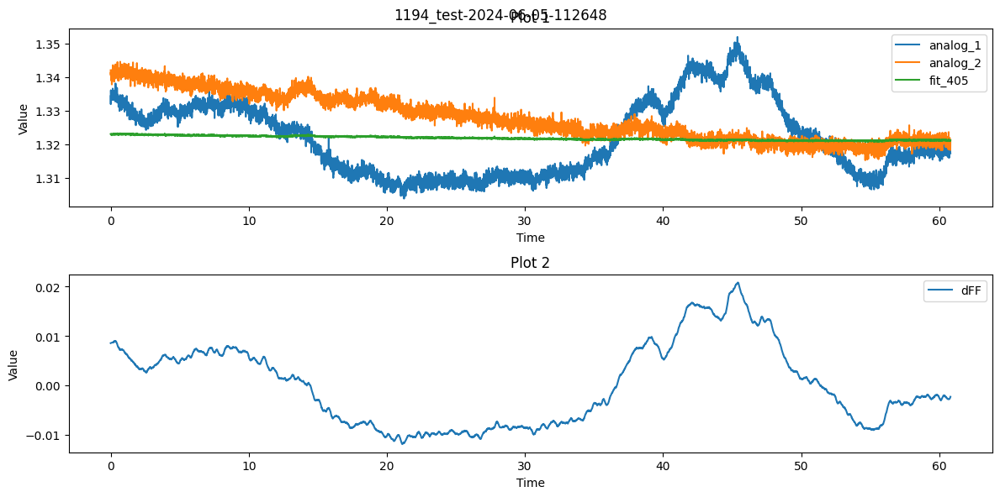

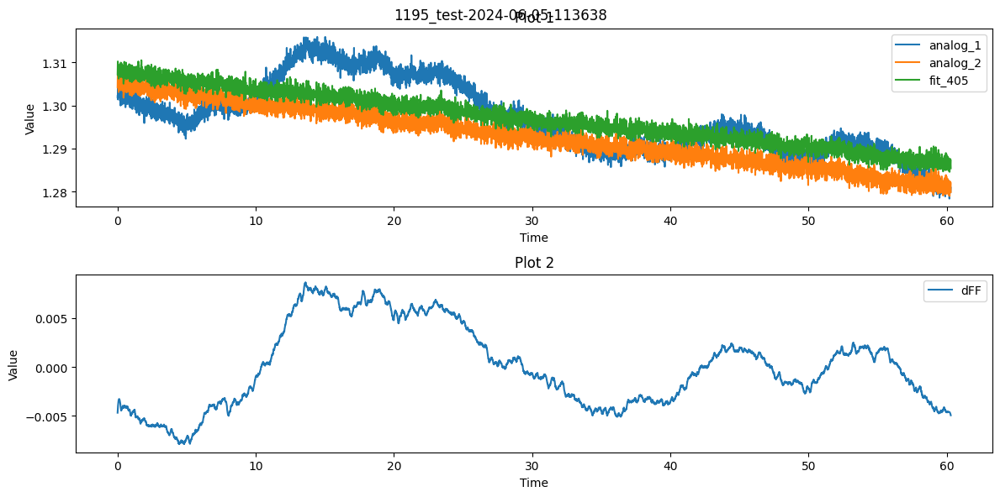

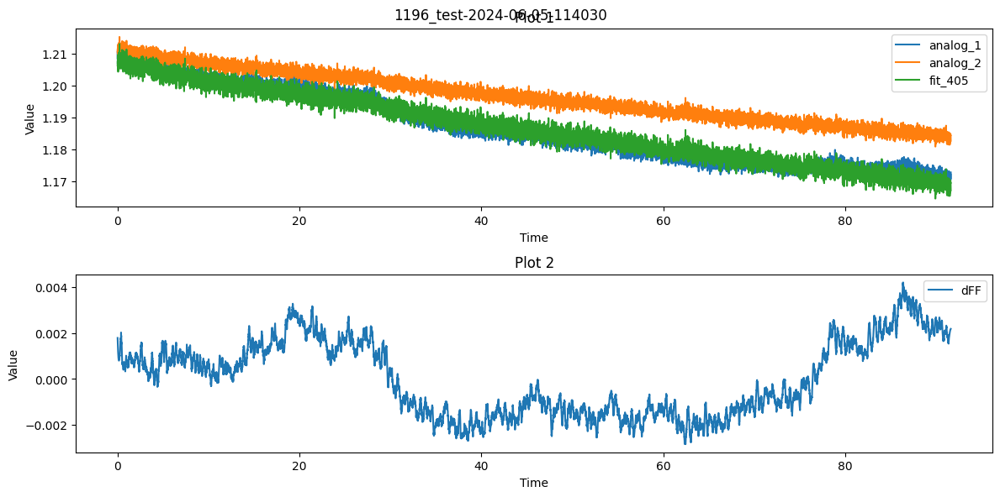

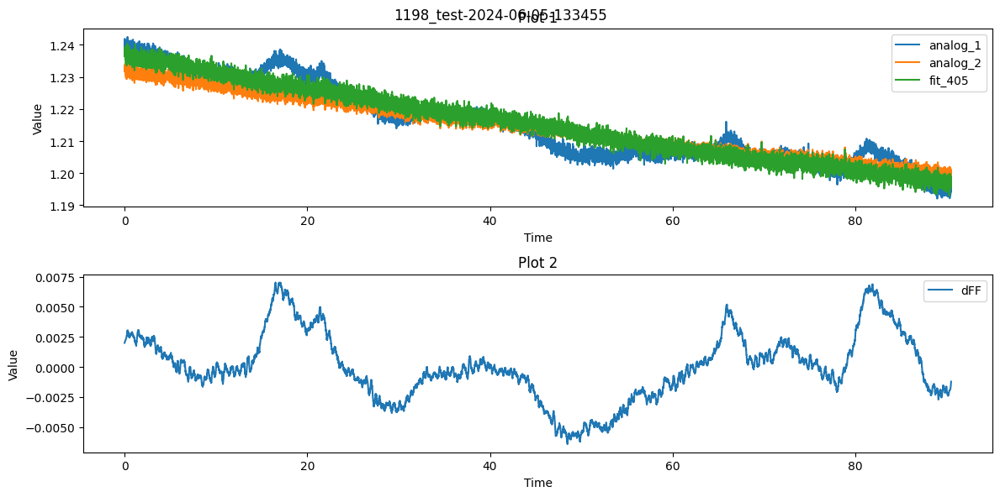

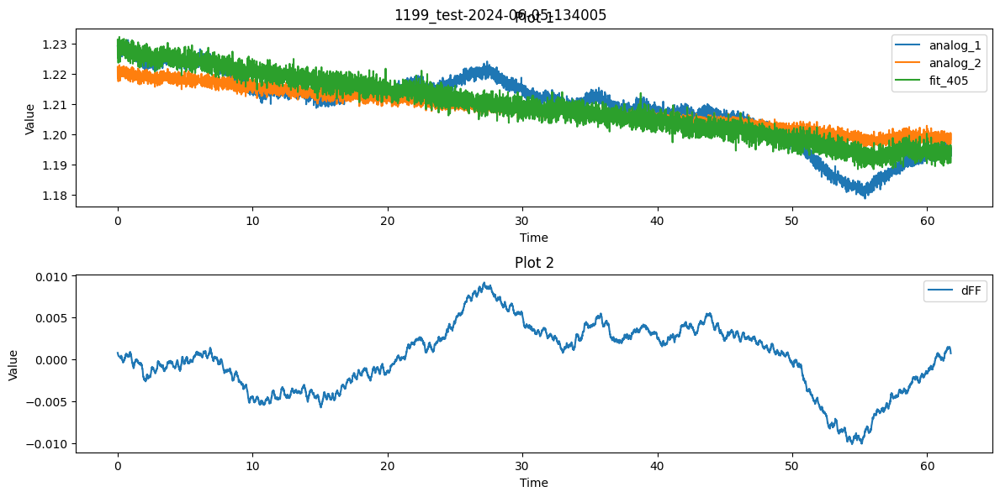

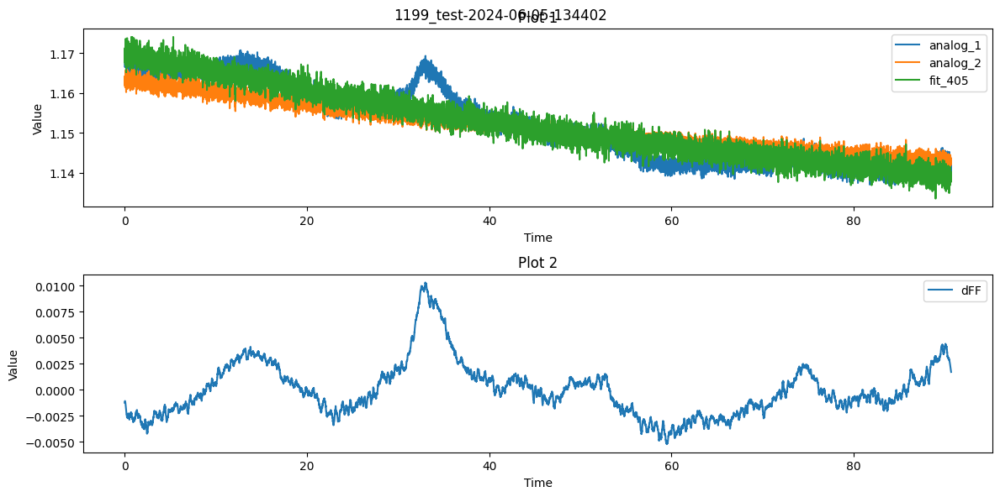

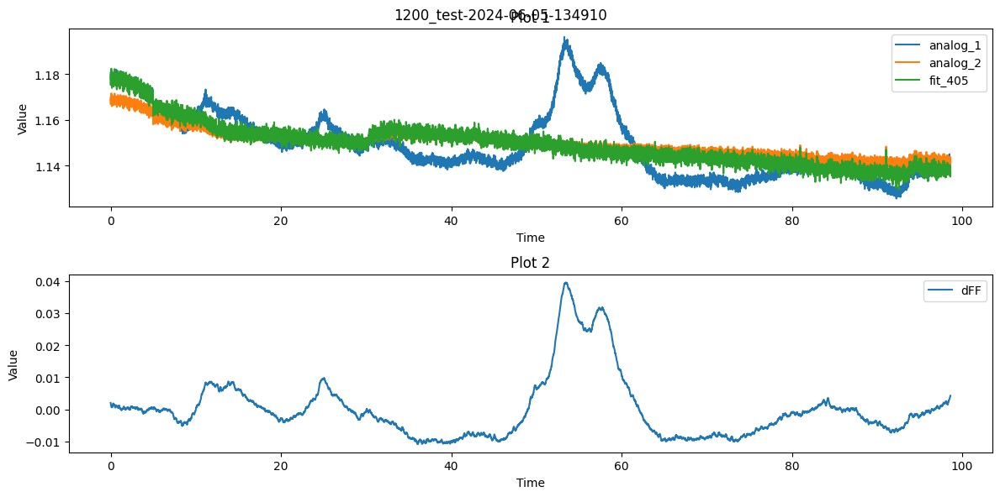

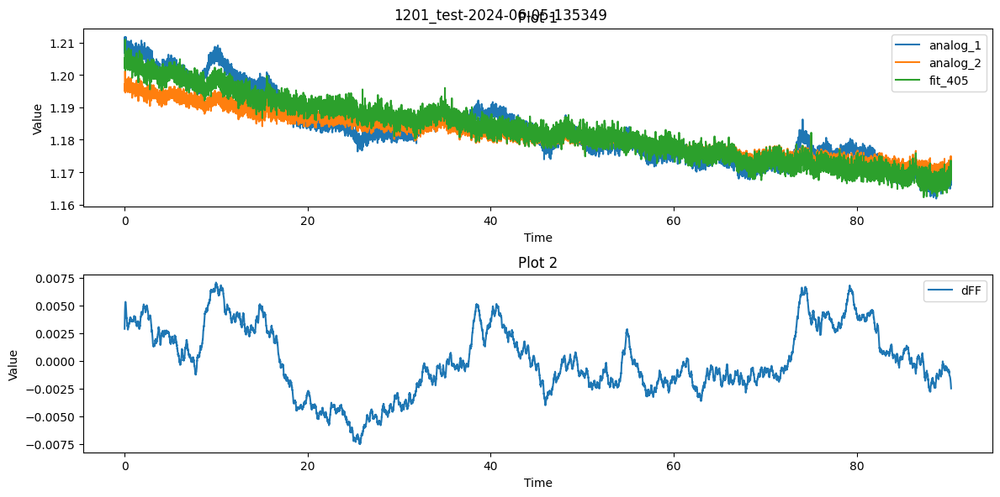

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import plotly.graph_objects as go
import glob
from data_import import import_ppd


# Define the folder containing the .ppd files
folder_path = r'H:\fp_test'

# List all .ppd files in the folder
ppd_files = glob.glob(os.path.join(folder_path, '*.ppd'))

for ppd_file_path in ppd_files:
    # Extract the filename without the extension
    filename = os.path.splitext(os.path.basename(ppd_file_path))[0]

    # Load the data from the CSV file
    data = import_ppd(ppd_file_path, low_pass=20, high_pass=0.001)

    # Convert sample index to time vector
    time = np.arange(len(data['analog_1'])) / 130

    # http://dx.doi.org/10.1016/j.cell.2015.07.014
    # dFF using 405 fit as baseline
    reg = np.polyfit(data['analog_2'], data['analog_1'], 1) # ch1 is 465nm, ch2 is 405nm 
    fit_405 = reg[0] * data['analog_2'] + reg[1]
    dFF = (data['analog_1'] - fit_405) / fit_405 # this gives deltaF/F
    data['fit_405'] = fit_405
    data['dFF'] = dFF

    # Apply Savitzky-Golay filter to smooth dFF
    smoothed_dFF = savgol_filter(dFF, window_length=51, polyorder=3)

    # Create the figure and subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))

    # Plot 1
    ax1.plot(time, data['analog_1'], label='analog_1')
    ax1.plot(time, data['analog_2'], label='analog_2')
    ax1.plot(time, data['fit_405'], label='fit_405')

    # Set plot 1 properties
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Value')
    ax1.set_title('Plot 1')
    ax1.legend()

    # Plot 2
    ax2.plot(time, smoothed_dFF, label='dFF')

    # Set plot 2 properties
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Value')
    ax2.set_title('Plot 2')
    ax2.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Set the figure title
    fig.suptitle(filename)

    # Save the figure as PNG with 300 dpi
    save_path = os.path.join(os.path.dirname(ppd_file_path), filename + '.png')
    fig.savefig(save_path, dpi=300)

    # Display the plots
    plt.show()

    # Create the plot
    fig = go.Figure()

    # Add a trace
    fig.add_trace(go.Scatter(x=time, y=smoothed_dFF, mode='lines', name='dFF'))

    # Customize the layout
    fig.update_layout(
        title='Interactive dFF Plot',
        xaxis_title='Time (s)',
        yaxis_title='dFF',
        template='plotly_dark'
    )

    #save_path_plotly = os.path.join(os.path.dirname(ppd_file_path), filename + '_plotly.png')
    #fig.write_image(save_path_plotly, format='png', scale=5)

    # Show the plot
    fig.show()
